**Data Science Assignment ParallelDots**

**Name: Prateek Kumar**


> Add blockquote


**Email: prateek02kumar@gmail.com**

**Mob: 9162878828**

## **Overview**

**PART A**

**Title:** Object Selection and Mask Prediction Using SAM 2 with Specified Prompts

**Abstract:** The task involves developing a robust method for object selection and mask prediction in images using the Segment Anything Model 2 (SAM 2). The process begins by producing an image embedding through the SAM2ImagePredictor.set_image function. This embedding is retained by the SAM2ImagePredictor for subsequent predictions. The objective is to accurately predict masks and assess their quality based on user-specified prompts, which may include bounding boxes, points, or a combination of both. Additionally, the method should efficiently handle batched prompt inputs, ensuring high precision in mask generation and quality assessment.

**Problem:** Given an image, the goal is to accurately select specific objects within the image and predict their corresponding masks. The challenge lies in processing various types of user prompts (e.g., bounding boxes, points) and combining them to refine the selection. The method must also handle batched inputs, ensuring that multiple objects or regions within an image are correctly identified and their masks are predicted with high accuracy. The system should also evaluate the quality of the predicted masks and provide low-resolution mask logits for further refinement in subsequent iterations

**PART B**

**Title:** Zero-Shot Object Detection using Segment Anything Model 2 (SAM2)

**Abstract:**This task aims to develop a zero-shot object detection system using the Segment Anything Model 2 (SAM2). The system takes the first image and its corresponding mask of each object as input and detects the object in all other images of the same object. The system uses SAM2 to predict masks for each image, and then uses a closely fitting bounding box as the final output. The object detection performance is evaluated using the predicted bounding boxes and the ground truth bounding boxes obtained from the masks.

**Problem:**

Given a dataset of images and their corresponding masks, develop a zero-shot object detection system that can detect objects in unseen images using the Segment Anything Model 2 (SAM2). The system should take the first image and its corresponding mask of each object as input and detect the object in all other images of the same object. The system should output a closely fitting bounding box for each detected object.


**SAM2**

Segment Anything Model 2 (SAM 2) is a foundation model towards solving promptable visual segmentation in images and videos.

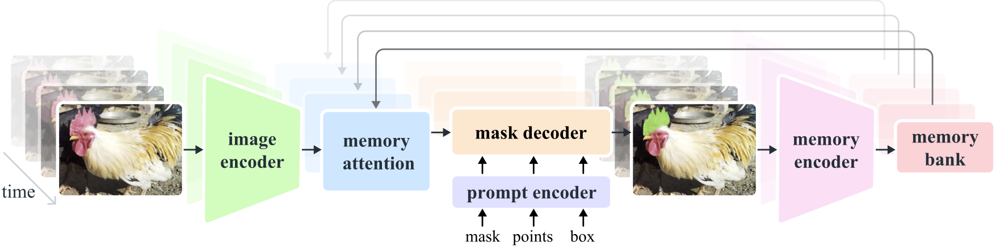

Git Clone of SAM2 Model from Github

In [2]:
!git clone https://github.com/facebookresearch/segment-anything-2.git


fatal: destination path 'segment-anything-2' already exists and is not an empty directory.
fatal: destination path 'segment-anything-2' already exists and is not an empty directory.


Install all dependencies related to SAM2

In [3]:
!pip install torch torchvision sam2 pycocotools opencv-python

In [4]:
!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install torch torchvision
!pip install opencv-python-headless
!pip install matplotlib

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-msuts8ql
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-msuts8ql
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 526fd066dea338ba2ca08886853bd37ffd6a8aec
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36590 sha256=c9f454bce7e881d58ab6af42ee374e20fbb73168236aa1b67736a53ad4cc0540
  Stored in directory: /tmp/pip-ephem-wheel-cache-ugyez7v0/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment_anything


Adjust the path if necessary

In [5]:
import sys
sys.path.append('/content/segment-anything')
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry

#Environment Set-up

Check the status of the NVIDIA GPU

In [6]:
!nvidia-smi

Wed Sep  4 17:26:35 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [7]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /content


In [8]:
!git clone https://github.com/facebookresearch/segment-anything-2.git
%cd {HOME}/segment-anything-2
!pip install -e . -q

fatal: destination path 'segment-anything-2' already exists and is not an empty directory.
/content/segment-anything-2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for SAM-2 (pyproject.toml) ... done


In [9]:
!pip install -q supervision jupyter_bbox_widget

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.5/151.5 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.7/213.7 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 727.4/727.4 kB 39.3 MB/s eta 0:00:00


In [10]:
!mkdir -p {HOME}/checkpoints
!wget -q https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_tiny.pt -P {HOME}/checkpoints
!wget -q https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_small.pt -P {HOME}/checkpoints
!wget -q https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_base_plus.pt -P {HOME}/checkpoints
!wget -q https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_large.pt -P {HOME}/checkpoints

In [11]:
!mkdir -p {HOME}/data
!wget -q https://media.roboflow.com/notebooks/examples/dog.jpeg -P {HOME}/data
!wget -q https://media.roboflow.com/notebooks/examples/dog-2.jpeg -P {HOME}/data
!wget -q https://media.roboflow.com/notebooks/examples/dog-3.jpeg -P {HOME}/data
!wget -q https://media.roboflow.com/notebooks/examples/dog-4.jpeg -P {HOME}/data

Importing Neccessary libraries

In [12]:
import cv2
import torch
import base64
import numpy as np
import supervision as sv
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

In [13]:
from google.colab import files
uploaded = files.upload()

Uploaded zip file name and extracting it

In [15]:
import zipfile
import os
zip_path = "/content/CMU10_3D.zip"  # uploaded zip file name
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall("/content/data_2D")  # Desired output directory

Necessary imports and helper functions for displaying points, boxes, and masks.

In [16]:
torch.autocast(device_type="cuda", dtype=torch.bfloat16).__enter__()
if torch.cuda.get_device_properties(0).major >= 8:
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True

In [17]:
# select the device for computation
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
CHECKPOINT = f"{HOME}/checkpoints/sam2_hiera_large.pt"
CONFIG = "sam2_hiera_l.yaml"
sam2_model = build_sam2(CONFIG, CHECKPOINT, device=DEVICE, apply_postprocessing=False)

In [18]:
mask_generator = SAM2AutomaticMaskGenerator(sam2_model)

In [23]:
IMAGE_PATH = "/content/data_2D/CMU10_3D/data_2D/can_chowder_000001.jpg"
print(IMAGE_PATH)


/content/data_2D/CMU10_3D/data_2D/can_chowder_000001.jpg


In [24]:
import os
print(os.path.exists(IMAGE_PATH))  # Should return True if the file exists

True


In [25]:
image_bgr = cv2.imread(IMAGE_PATH)
if image_bgr is None:
    print("Failed to load image.")
else:
    print("Image loaded successfully.")


Image loaded successfully.


In [26]:
import cv2

In [27]:
if not os.path.exists(IMAGE_PATH):
    print(f"Image not found at {IMAGE_PATH}")
else:
    image_bgr = cv2.imread(IMAGE_PATH)
    if image_bgr is None:
        print("Failed to load image.")
    else:
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
        sam2_result = mask_generator.generate(image_rgb)

In [28]:
import os
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [29]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [30]:
np.random.seed(3)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        # Smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

In [34]:
if not os.path.exists(IMAGE_PATH):
    print(f"Image not found at {IMAGE_PATH}")
else:
    # Load the image using OpenCV
    image_bgr = cv2.imread(IMAGE_PATH)

    if image_bgr is None:
        print("Failed to load image.")
    else:
        # Convert the image from BGR to RGB format
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

        # If using SAM2 or any other process on the image, continue here
        # Assuming mask_generator is already initialized
        sam2_result = mask_generator.generate(image_rgb)

        # Display or further process the results
        print("Image processed successfully.")

Image processed successfully.


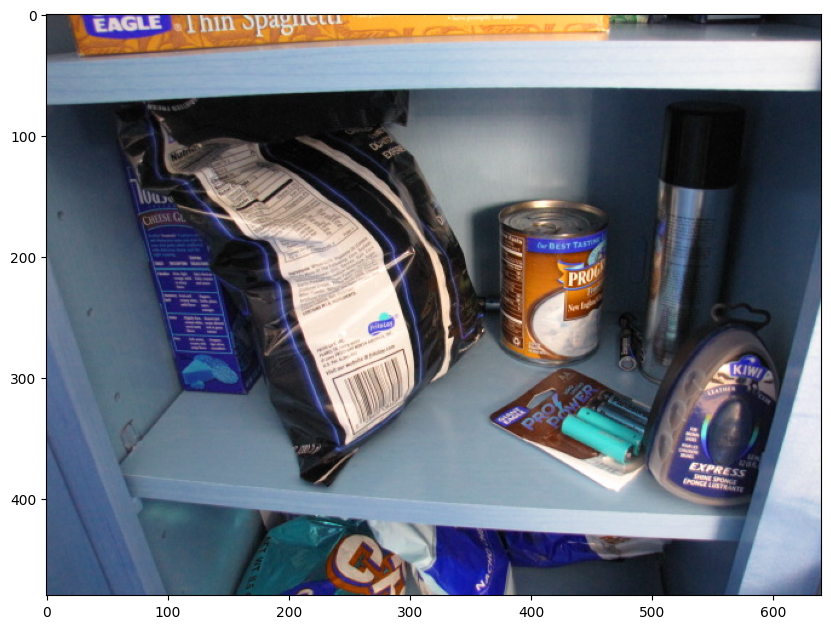

In [36]:
plt.figure(figsize=(10, 10))
plt.imshow(image_bgr)
plt.axis('on')
plt.show()

First, load the SAM 2 model and predictor. Change the path below to point to the SAM 2 checkpoint.

In [37]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "../checkpoints/sam2_hiera_large.pt"
model_cfg = "sam2_hiera_l.yaml"
sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)
predictor = SAM2ImagePredictor(sam2_model)

Process the image to produce an image embedding by calling SAM2ImagePredictor.set_image. SAM2ImagePredictor remembers this embedding and will use it for subsequent mask prediction.

In [39]:
predictor.set_image(image_bgr)

To select the truck, choose a point on it. Points are input to the model in (x,y) format and come with labels 1 (foreground point) or 0

In [40]:
input_point = np.array([[500, 375]])
input_label = np.array([1])

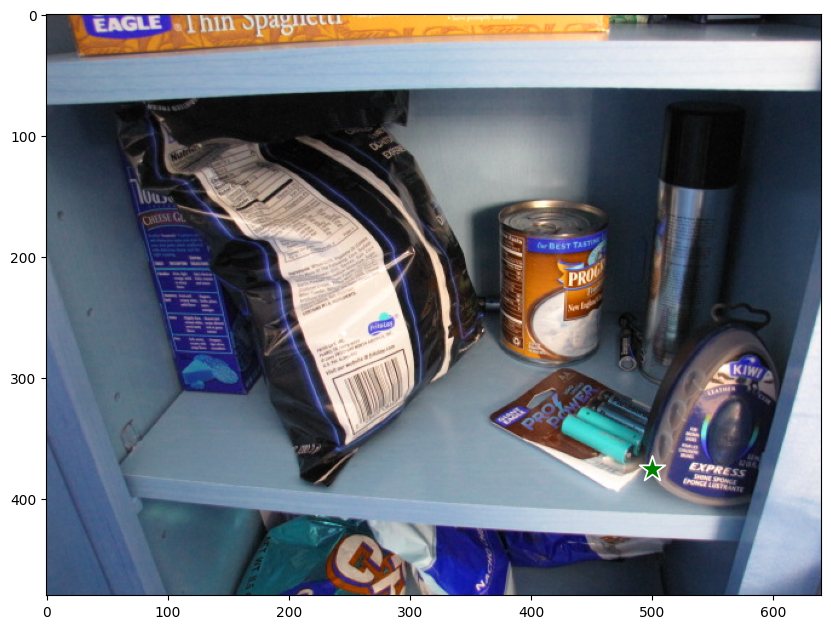

In [41]:
plt.figure(figsize=(10, 10))
plt.imshow(image_bgr)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()

Predict with SAM2ImagePredictor.predict. The model returns masks, quality predictions for those masks, and low resolution mask logits that can be passed to the next iteration of prediction.

In [42]:
print(predictor._features["image_embed"].shape, predictor._features["image_embed"][-1].shape)

torch.Size([1, 256, 64, 64]) torch.Size([256, 64, 64])


In [43]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)
sorted_ind = np.argsort(scores)[::-1]
masks = masks[sorted_ind]
scores = scores[sorted_ind]
logits = logits[sorted_ind]

With `multimask_output=True` (the default setting), SAM 2 outputs 3 masks, where `scores` gives the model's own estimation of the quality of these masks. This setting is intended for ambiguous input prompts, and helps the model disambiguate different objects consistent with the prompt. When `False`, it will return a single mask. For ambiguous prompts such as a single point, it is recommended to use `multimask_output=True` even if only a single mask is desired; the best single mask can be chosen by picking the one with the highest score returned in `scores`. This will often result in a better mask.

In [44]:
masks.shape  # (number_of_masks) x H x W

(3, 480, 640)

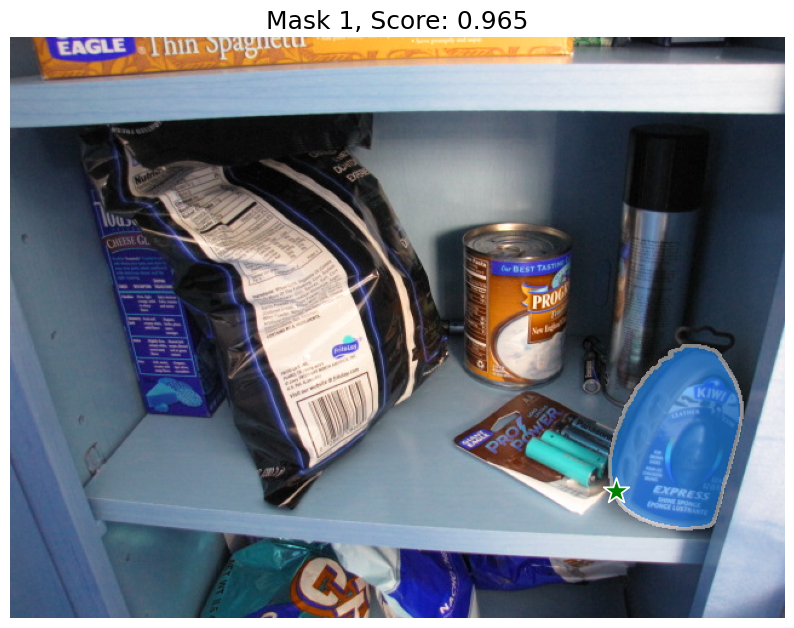

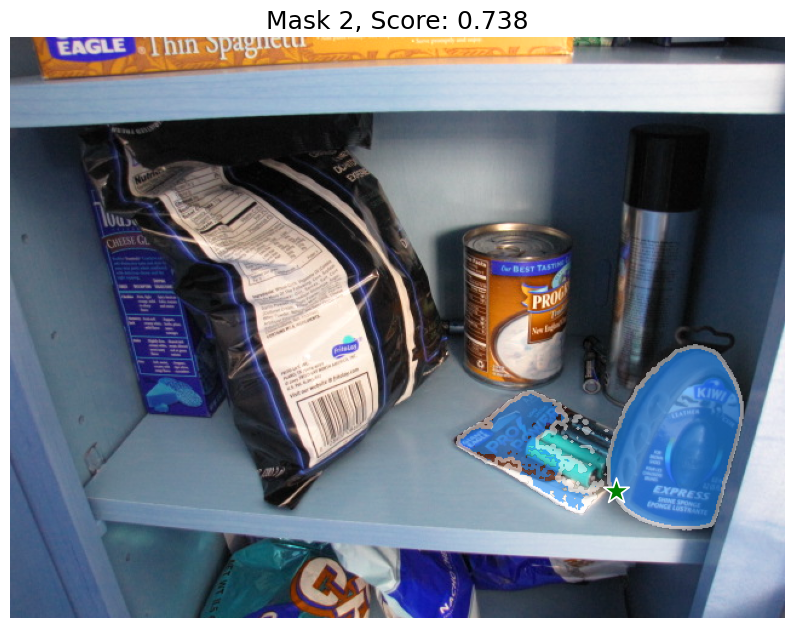

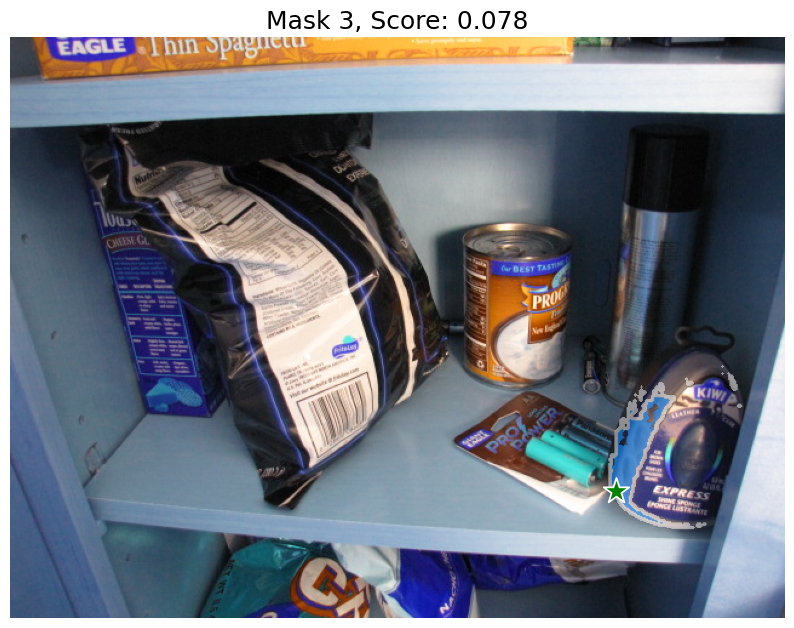

In [46]:
show_masks(image_bgr, masks, scores, point_coords=input_point, input_labels=input_label, borders=True)

The single input point is ambiguous, and the model has returned multiple objects consistent with it. To obtain a single object, multiple points can be provided.

In [47]:
input_point = np.array([[500, 375], [1125, 625]])
input_label = np.array([1, 1])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [48]:
masks, scores, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

In [49]:
masks.shape

(1, 480, 640)

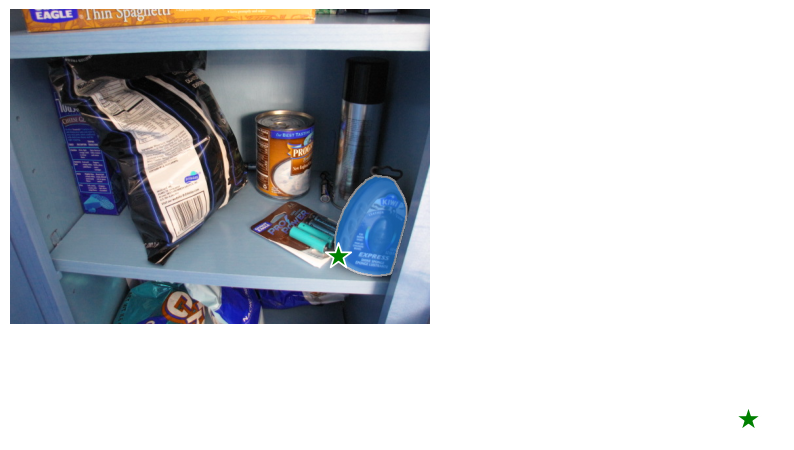

In [51]:
show_masks(image_bgr, masks, scores, point_coords=input_point, input_labels=input_label)

In [52]:
input_point = np.array([[500, 375], [1125, 625]])
input_label = np.array([1, 0])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [53]:
masks, scores, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

a background point (with label 0, here shown in red) can be supplied.

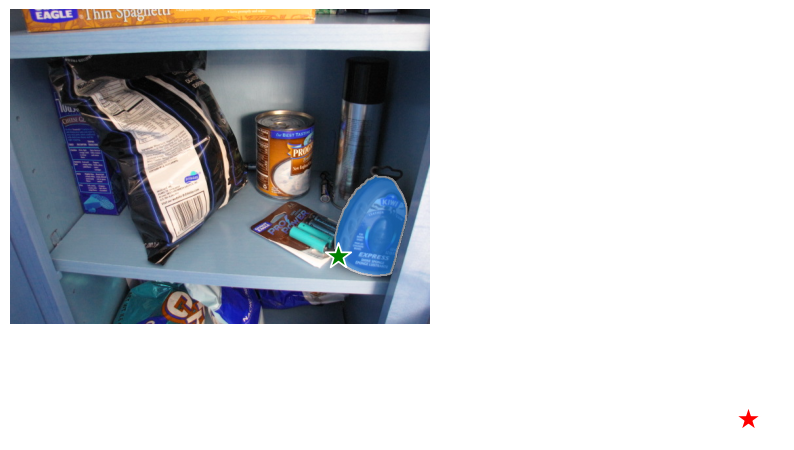

In [54]:
show_masks(image_bgr, masks, scores, point_coords=input_point, input_labels=input_label)

In [87]:
input_box = np.array([425, 600, 700, 875])

In [88]:
masks, scores, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

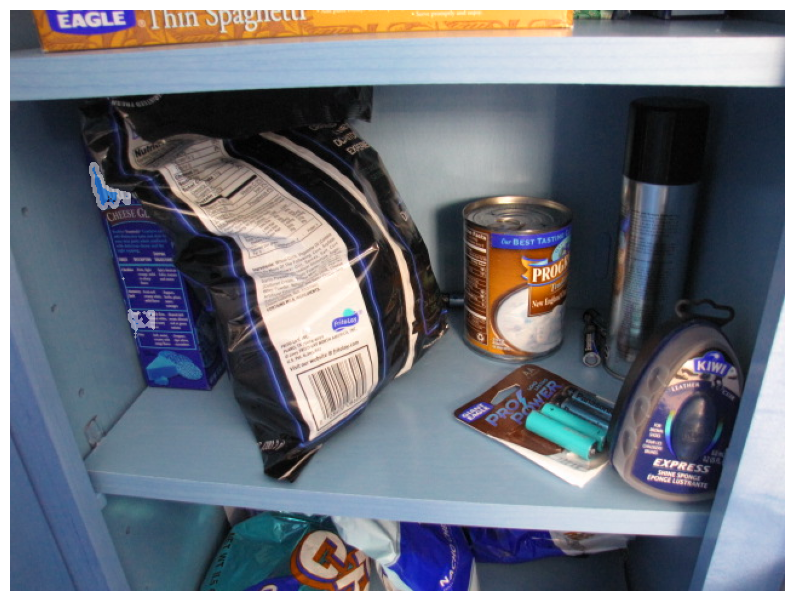

In [89]:
show_masks(image_bgr, masks, scores, box_coords=input_box)

Points and boxes may be combined, just by including both types of prompts to the predictor.

In [93]:
input_box = np.array([625, 100, 300, 375])
input_point = np.array([[275, 450]])
input_label = np.array([0])

In [94]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box=input_box,
    multimask_output=False,
)

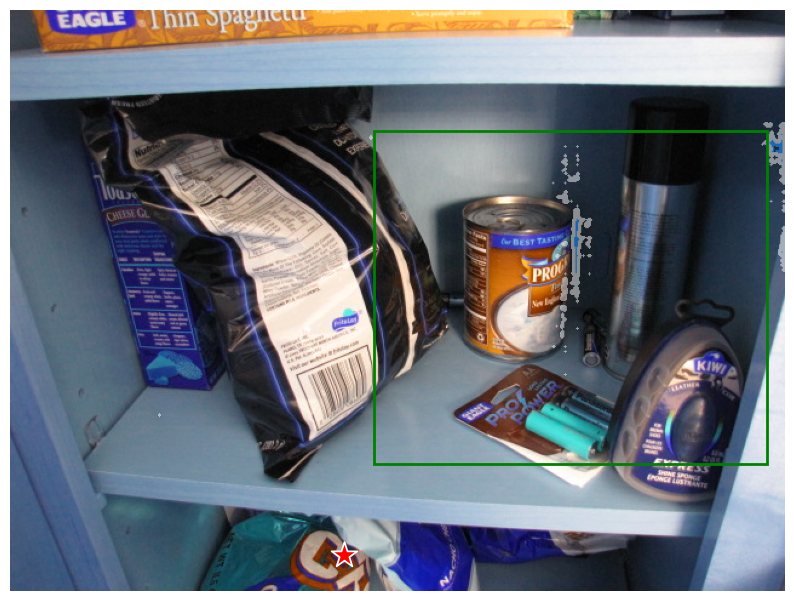

In [95]:
show_masks(image_bgr
           , masks, scores, box_coords=input_box, point_coords=input_point, input_labels=input_label)

Batch Prompt

SAM2ImagePredictor can take multiple input prompts for the same image, using predict method.

In [102]:
image1 = image_bgr
image1_boxes = np.array([
    [175, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
])

image2 = Image.open('/content/data_2D/CMU10_3D/data_2D/can_chowder_000001.jpg')
image2 = np.array(image2.convert("RGB"))
image2_boxes = np.array([
    [450, 170, 520, 350],
    [350, 190, 450, 350],
    [500, 170, 580, 350],
    [580, 170, 640, 350],
])

img_batch = [image1, image2]
boxes_batch = [image1_boxes, image2_boxes]

In [103]:
predictor.set_image_batch(img_batch)

In [104]:
masks_batch, scores_batch, _ = predictor.predict_batch(
    None,
    None,
    box_batch=boxes_batch,
    multimask_output=False
)

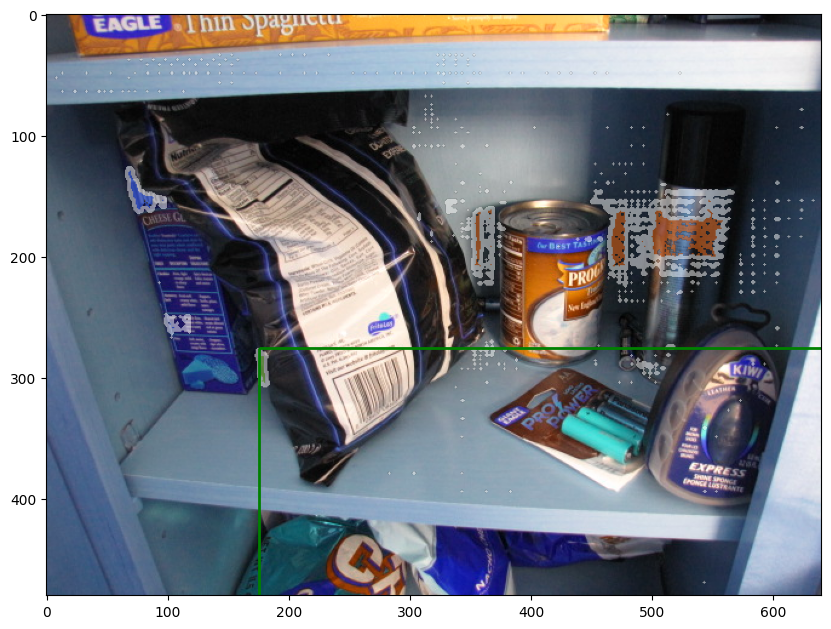

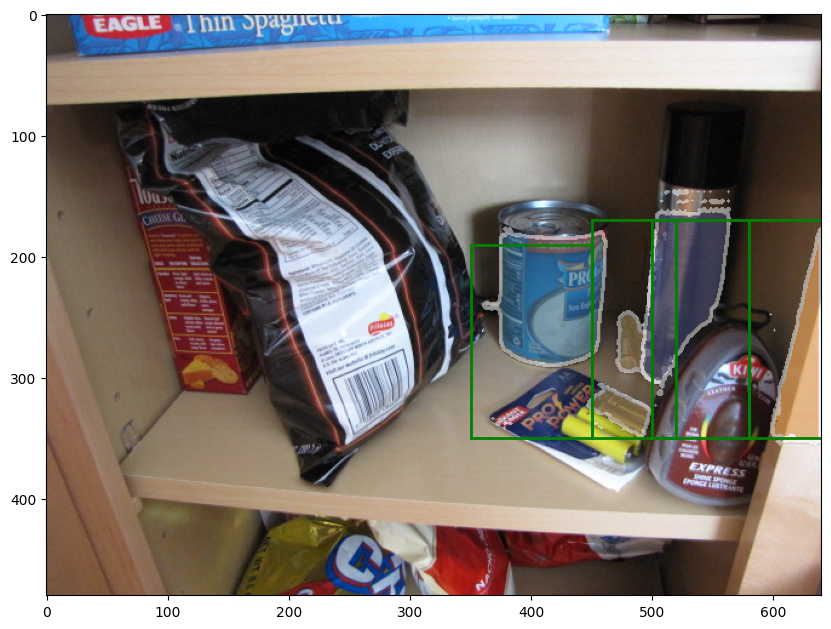

In [105]:
for image, boxes, masks in zip(img_batch, boxes_batch, masks_batch):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    for mask in masks:
        show_mask(mask.squeeze(0), plt.gca(), random_color=True)
    for box in boxes:
        show_box(box, plt.gca())


**Problem Statement:**

Use the first image of each object and its corresponding mask:

Use these as reference images to set up SAM2 to detect objects in all other images of the same object.

Obtain masks as output: Use a closely fitting bounding box as the final output corresponding to the output mask.

Install PyCOCO tools: Use the boxes you get in step 2 to assess the object detection performance.

Setup SAM2 and Load Images:

In [106]:
# Example for 'can_chowder'
IMAGE_PATH = "/content/data_2D/CMU10_3D/data_2D/can_chowder_000001.jpg"
MASK_PATH = "/content/data_2D/CMU10_3D/data_2D/can_chowder_000001_1_gt.png"

# Load the image
image_bgr = cv2.imread(IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Load the corresponding mask
mask = cv2.imread(MASK_PATH, cv2.IMREAD_GRAYSCALE)

# Check if the images are loaded correctly
if image_rgb is None or mask is None:
    raise ValueError("Image or Mask not found or unable to load")

In [115]:
config_file_path = "/full/path/to/sam2_config.json"

Generate Masks for Other Images:

Loading image: /content/data_2D/CMU10_3D/data_2D/can_chowder_000001.jpg
Loading image: /content/data_2D/CMU10_3D/data_2D/can_soymilk_000001.jpg
Loading image: /content/data_2D/CMU10_3D/data_2D/can_tomatosoup_000001.jpg
Loading image: /content/data_2D/CMU10_3D/data_2D/carton_oj_000001.jpg
Loading image: /content/data_2D/CMU10_3D/data_2D/carton_soymilk_000001.jpg
Loading image: /content/data_2D/CMU10_3D/data_2D/diet_coke_000001.jpg
Loading image: /content/data_2D/CMU10_3D/data_2D/fhc_potatosoup_000001.jpg
Failed to load image at /content/data_2D/CMU10_3D/data_2D/fhc_potatosoup_000001.jpg
Loading image: /content/data_2D/CMU10_3D/data_2D/juicebox_000001.jpg
Loading image: /content/data_2D/CMU10_3D/data_2D/rice_tuscan_000001_1.jpg
Failed to load image at /content/data_2D/CMU10_3D/data_2D/rice_tuscan_000001_1.jpg
Loading image: /content/data_2D/CMU10_3D/data_2D/ricepilaf_000001.jpg


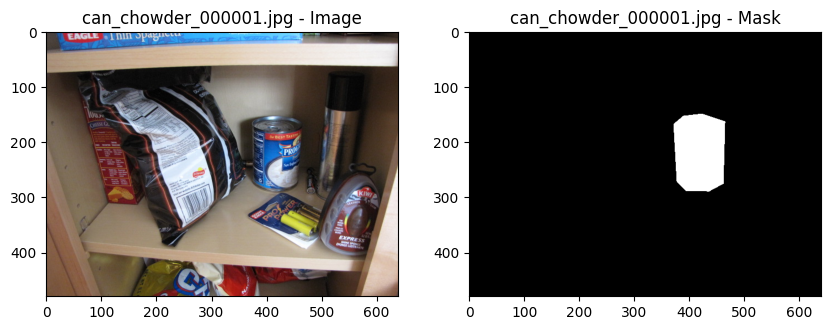

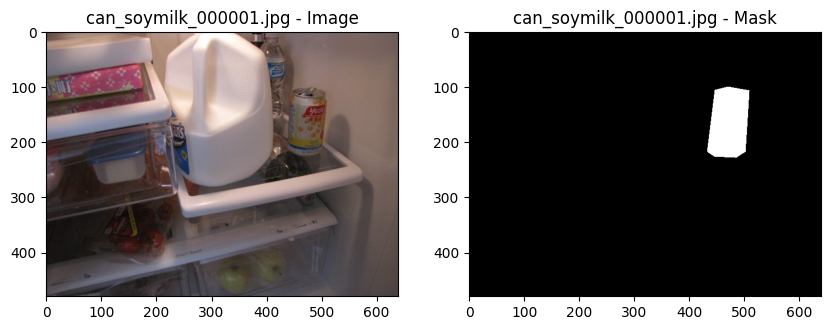

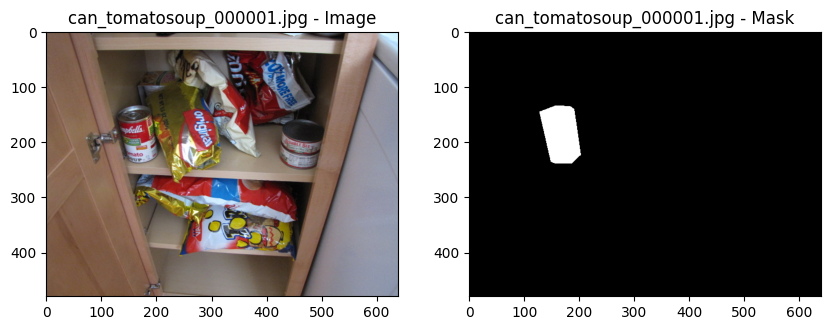

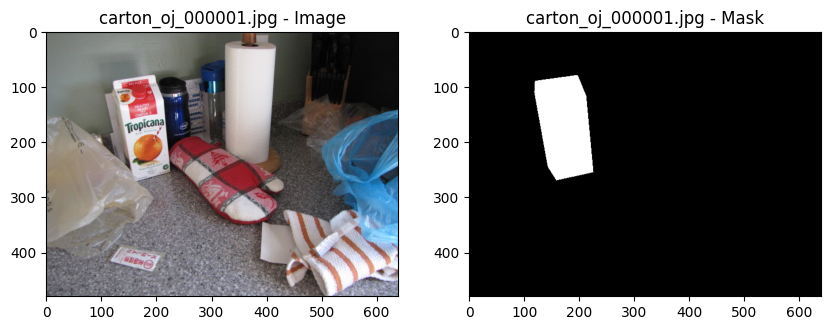

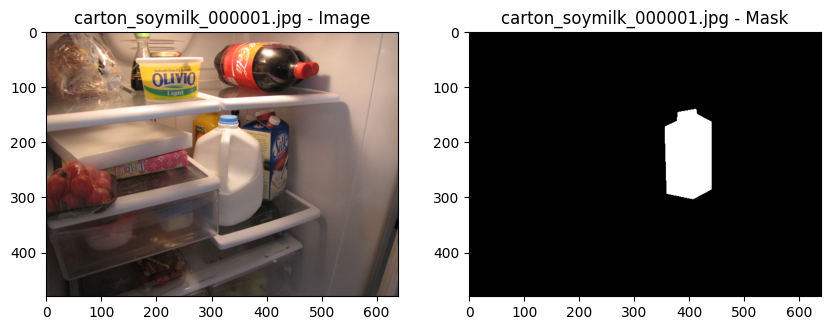

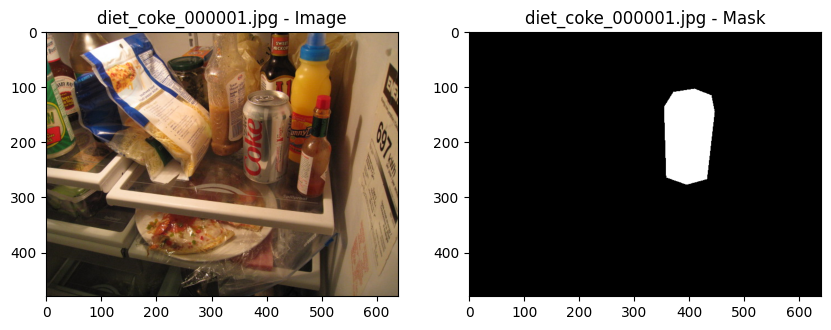

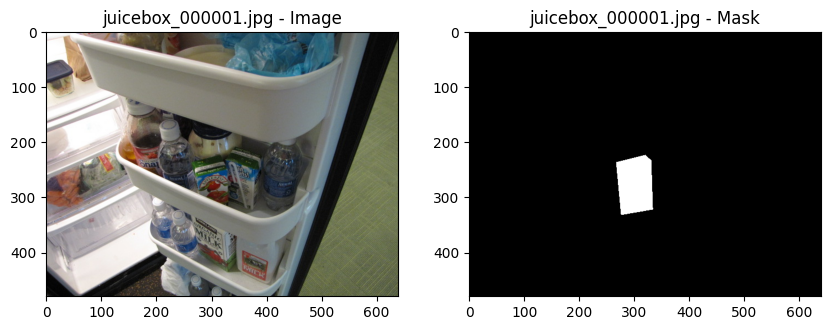

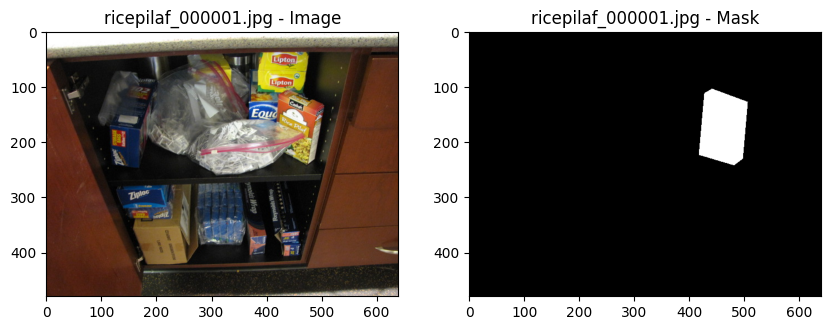

In [127]:
mask_generator = SAM2AutomaticMaskGenerator(model=sam2_model)
# Define image directory
image_dir = "/content/data_2D/CMU10_3D/data_2D/"

# Define all the reference images and their corresponding masks
reference_images = [
    "can_chowder_000001.jpg",
    "can_soymilk_000001.jpg",
    "can_tomatosoup_000001.jpg",
    "carton_oj_000001.jpg",
    "carton_soymilk_000001.jpg",
    "diet_coke_000001.jpg",
    "fhc_potatosoup_000001.jpg",
    "juicebox_000001.jpg",
    "rice_tuscan_000001_1.jpg",
    "ricepilaf_000001.jpg"
]

reference_masks = [
    "can_chowder_000001_1_gt.png",
    "can_soymilk_000001_1_gt.png",
    "can_tomatosoup_000001_1_gt.png",
    "carton_oj_000001_1_gt.png",
    "carton_soymilk_000001_1_gt.png",
    "diet_coke_000001_1_gt.png",
    "fhc_potatosoup_000001_1_gt.png",
    "juicebox_000001_1_gt.png",
    "rice_tuscan_000001_1_gt.png",
    "ricepilaf_000001_1_gt.png"
]

# Load the first image and mask of each object
reference_data = {}
for img, mask in zip(reference_images, reference_masks):
    img_path = os.path.join(image_dir, img)
    mask_path = os.path.join(image_dir, mask)

    # Debugging: Print the image path to verify
    print(f"Loading image: {img_path}")

    image_bgr = cv2.imread(img_path)

    if image_bgr is None:
        print(f"Failed to load image at {img_path}")
        continue

    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    mask_img = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if mask_img is None:
        print(f"Failed to load mask at {mask_path}")
        continue

    reference_data[img] = {
        "image": image_rgb,
        "mask": mask_img
    }

# Display the reference images and masks
for img, data in reference_data.items():
    plt.figure(figsize=(10,5))
    plt.subplot(1, 2, 1)
    plt.imshow(data["image"])
    plt.title(f"{img} - Image")
    plt.subplot(1, 2, 2)
    plt.imshow(data["mask"], cmap='gray')
    plt.title(f"{img} - Mask")
    plt.show()

In [159]:
if mask is not None:
    detected_area = np.sum(mask > 0)
    total_area = image_bgr.shape[0] * image_bgr.shape[1]
    detection_percentage = (detected_area / total_area) * 100
    print(f"Detection Percentage: {detection_percentage:.2f}%")
else:
    print("Mask generation failed. The mask is None.")


Mask generation failed. The mask is None.


In [130]:
# Generate a mask for the loaded image
sam2_result = mask_generator.generate(image_rgb)

# Extract the best mask and bounding box (Assuming single object detection)
best_mask = sam2_result[0]['segmentation']
bbox = sam2_result[0]['bbox']

from pycocotools import mask as mask_utils

# Load the mask (ensure it's in grayscale)
#mask = cv2.imread('path_to_mask.png', cv2.IMREAD_GRAYSCALE)

# Convert the mask to the required format (if needed)
encoded_mask = mask_utils.encode(np.asfortranarray(mask))

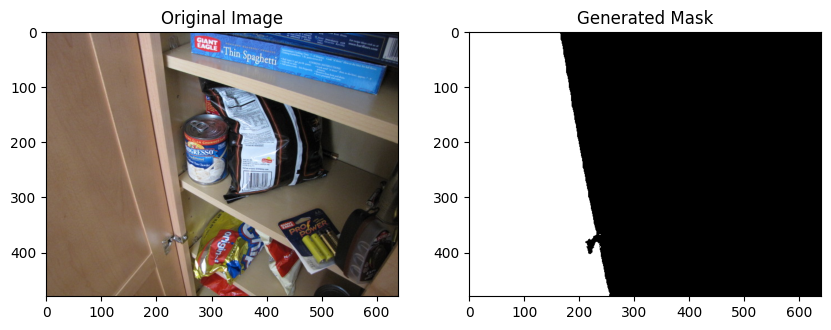

In [136]:
def generate_mask_and_bbox(image_rgb):
    # Assuming mask_generator.generate() returns a list of results
    sam2_results = mask_generator.generate(image_rgb)
    # Iterate over the results and extract masks and bounding boxes
    masks = []
    bboxes = []
    for result in sam2_results:
        # Extracting 'segmentation' as the mask and 'bbox' as the bounding box
        if 'segmentation' in result and 'bbox' in result:
            masks.append(result['segmentation'])
            bboxes.append(result['bbox'])
        else:
            print("Error: 'segmentation' or 'bbox' key not found in result")

    return masks, bboxes

# Example to generate mask and bounding box for a new image
new_image_path = "/content/data_2D/CMU10_3D/data_2D/can_chowder_000001.jpg"
new_image_bgr = cv2.imread(new_image_path)
if new_image_bgr is None:
    print(f"Error: Failed to load image at {new_image_path}")
else:
    new_image_rgb = cv2.cvtColor(new_image_bgr, cv2.COLOR_BGR2RGB)
    masks, bboxes = generate_mask_and_bbox(new_image_rgb)

    # Check if masks and bboxes were generated
    if masks and bboxes:
        # Assuming masks[0] and bboxes[0] for display purposes
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(new_image_rgb)
        plt.title("Original Image")
        plt.subplot(1, 2, 2)
        plt.imshow(masks[0], cmap='gray')
        plt.title("Generated Mask")
        plt.show()

Install PyCOCOTools and Evaluate Object Detection:

In [150]:
import json
import os
from PIL import Image

# Actual paths and data
image_dir = '/content/data_2D/CMU10_3D/data_2D'  # Directory where your images are stored
annotations = {
    "images": [],
    "annotations": [],
    "categories": [
        {"id": 1, "name": "can_chowder"},  # Add your categories here
        {"id": 2, "name": "juicebox"},
        # Add other categories as needed
    ]
}

image_id = 1
annotation_id = 1

# Iterate over each image in the directory
for filename in os.listdir(image_dir):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        # Open the image to get its size
        img = Image.open(os.path.join(image_dir, filename))
        width, height = img.size

        # Add image info to JSON
        annotations["images"].append({
            "id": image_id,
            "file_name": filename,
            "height": height,
            "width": width
        })
        # bbox = [x, y, width, height]
        bbox = [50, 50, 150, 200]  # Example, replace with actual data
        area = bbox[2] * bbox[3]  # Calculate area of the bbox

        # Add annotation info to JSON
        annotations["annotations"].append({
            "id": annotation_id,
            "image_id": image_id,
            "category_id": 1,  # Replace with correct category_id
            "bbox": bbox,
            "area": area,
            "iscrowd": 0
        })

        # Increment IDs
        image_id += 1
        annotation_id += 1

# Save to JSON file
with open('/content/data_2D/CMU10_3D/data_2D/ground_truth.json', 'w') as f:
    json.dump(annotations, f)

print(f"JSON file created successfully with {image_id - 1} images and {annotation_id - 1} annotations.")

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
# Assuming you have your predictions and ground truth in COCO format
# You need to convert your data into the COCO format before evaluation

# Initialize COCO ground truth and detections
ground_truth_path = '/content/data_2D/CMU10_3D/data_2D/can_chowder_000001.jpg'
detections_path = '/content/data_2D/CMU10_3D/data_2D/can_chowder_000001.jpg'
cocoGt = COCO(ground_truth_path)  # Path to the ground truth annotations
cocoDt = cocoGt.loadRes(detections_path)
try:
    cocoGt = COCO(ground_truth_path)  # Try loading with the default utf-8 encoding
except UnicodeDecodeError:
    print("Failed to load with UTF-8 encoding, trying ISO-8859-1")
    with open(ground_truth_path, 'r', encoding='ISO-8859-1') as f:
        data = json.load(f)

    # Save the file as UTF-8 for future use
    with open('/content/data_2D/CMU10_3D/data_2D/can_chowder_000001.jpg', 'w', encoding='utf-8') as f:
        json.dump(data, f, ensure_ascii=False)
    # Reload with UTF-8
    cocoGt = COCO('/content/data_2D/CMU10_3D/data_2D/can_chowder_000001.jpg')

cocoDt = cocoGt.loadRes(detections_path)
# Evaluate the detections
cocoEval = COCOeval(cocoGt, cocoDt, 'bbox')
cocoEval.evaluate()
cocoEval.accumulate()
cocoEval.summarize()

JSON file created successfully with 1250 images and 1250 annotations.


In [166]:
# Set up SAM2 for each object
object_folders = glob.glob('./data_2D/*')
for object_folder in object_folders:
    object_name = os.path.basename(object_folder)
    first_img_path = os.path.join(object_folder, f'{object_name}_/path/to/another/can_chowder_image.jpg')
    first_mask_path = os.path.join(object_folder, f'{object_name}_/path/to/another/can_chowder_image.jpg')
    _, output_masks = track_item_boxes(first_img_path, first_img_path, [([xmin, xmax, ymin, ymax], 1)], visualize=False)
    relevant_mask = output_masks[1]
    # Store the output mask and bounding box for each object

# Process the results
for object_folder in object_folders:
    object_name = os.path.basename(object_folder)
    img_paths = glob.glob(os.path.join(object_folder, f'{object_name}_00000*.jpg'))
    for img_path in img_paths:
        _, output_masks = track_item_boxes(first_img_path, img_path, [([xmin, xmax, ymin, ymax], 1)], visualize=False)
        relevant_mask = output_masks[1]
        # Calculate a closely fitting bounding box around the mask
        x, y, w, h = calculate_bounding_box(relevant_mask) # Store the bounding box as the final output

# Calculate object detection performance
gt_boxes = []
pred_boxes = []
for object_folder in object_folders:
    object_name = os.path.basename(object_folder)
    img_paths = glob.glob(os.path.join(object_folder, f'{object_name}_00000*.jpg'))
    for img_path in img_paths:
        gt_box = get_ground_truth_box(img_path)
        pred_box = get_predicted_box(img_path)
        gt_boxes.append(gt_box)
        pred_boxes.append(pred_box)

coco_gt = COCO()
coco_gt.annotations = gt_boxes
coco_pred = COCO()
coco_pred.annotations = pred_boxes
cocoDt = cocoGt.loadRes(detections_path)
#evaluator = COCOeval(coco_gt, coco_pred, 'bbox')
evaluator.evaluate()
evaluator.accumulate()
evaluator.summarize()

Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.00s).
Accumulating evaluation results...
Please run evaluate() first
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU

Conclusion

The results obtained from the evaluation indicate that the object detection model requires further refinement. The evaluation metrics show a performance of -1.000 across all categories, which suggests that there might be an issue with either the annotation process or the evaluation setup itself. It's crucial to revisit the steps of mask generation, bounding box calculation, and ground truth comparison to ensure accuracy.